In [3]:
# !uv pip install mostlyai
# !pip install uv
# !pip install -U mostlyai[local]

import sys
!"{sys.executable}" -m uv pip install mostlyai[local]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.8/17.8 MB 3.4 MB/s eta 0:00:00 MB/s eta 0:00:01:01m
Using Python 3.12.7 environment at: /home/mzahmerd/miniconda3/envs/py312
Resolved 185 packages in 8.71s                                       
Prepared 147 packages in 25m 11s                                         
Uninstalled 1 package in 1ms
Installed 147 packages in 144ms                             
 + accelerate==1.7.0
 + adlfs==2024.12.0
 + aiobotocore==2.23.0
 + aiohappyeyeballs==2.6.1
 + aiohttp==3.12.12
 + aioitertools==0.12.0
 + aiosignal==1.3.2
 + annotated-types==0.7.0
 + azure-common==1.1.28
 + azure-core==1.34.0
 + azure-datalake-store==0.0.53
 + azure-identity==1.23.0
 + azure-storage-blob==12.25.1
 + azure-storage-file-datalake==12.20.0
 + bcrypt==4.3.0
 + boto3==1.38.27
 + botocore==1.38.27
 + cachetools==5.5.2
 + click==8.2.1
 + cloudpathlib==0.21.1
 + contourpy==1.3.2
 + cryptography==45.0.4
 + cycler==0.12.1
 + datasets==3.6.0
 + dill==0.3.8
 + duckdb==1.3.0
 + envir

In [4]:
# initialize the SDK

from mostlyai.sdk import MostlyAI
mostly = MostlyAI(local=True, local_port=5000)

# Show generator training docstring for correct config
print(mostly.train.__doc__)

Initializing Synthetic Data SDK 4.7.7 in LOCAL mode 🏠

Connected to ]8;id=716182;http://127.0.0.1:5000\http://127.0.0.1:5000]8;;\ with 63 GB RAM, 32 CPUs, 1x NVIDIA GeForce RTX 4080 Laptop GPU available


        Create a generator resource. Once trained, it will include the model as well as optionally a model report.

        Note: A generator is initially being configured. That training job can be either launched immediately or later. One can check progress via `g.training.progress()`. Once the job has finished, the generator is available for use.

        Args:
            config (GeneratorConfig | dict | None): The configuration parameters of the generator to be created. Either `config` or `data` must be provided.
            data (pd.DataFrame | str | Path | None): A single pandas DataFrame, or a path to a CSV or PARQUET file. Either `config` or `data` must be provided.
            name (str | None): Name of the generator.
            start (bool): Whether to start training immediately. Default is True.
            wait (bool): Whether to wait for training to finish. Default is True.
            progress_bar (bool): Whether to display a progress bar during training. Default is Tru

In [7]:
import pandas as pd

df = pd.read_csv('/home/mzahmerd/mostly_flat_challenge/datasets/flat-training (original).csv')
shape = df.shape
info = df.dtypes

print(shape, info)

(100000, 80) dog            int64
cat           object
rabbit       float64
deer         float64
panda          int64
              ...   
storybook      int64
candle        object
clover       float64
bubble         int64
cookie        object
Length: 80, dtype: object


In [10]:
# Configure generator for 40 minutes training, aiming for exact reproduction (disable privacy, enable value protection off)
gen_config = {
    "name": "Abdulrahman Flat Dataset",
    "description": None,
    "tables": [
        {
            "name": "flat_training",
            "data": df,
            "tabular_model_configuration": {
                "model": "MOSTLY_AI/Medium",
                "max_sample_size": 100_000,
                "batch_size": 128,
                "gradient_accumulation_steps": None,
                "max_training_time": None,
                "max_epochs": 100,
                "max_sequence_window": 100,
                "enable_flexible_generation": False,
                "value_protection": False,
                "rare_category_replacement_method": "CONSTANT",
                "differential_privacy": None,
               # "compute": "c5f0d5da-04d9-4099-8394-e1048a469a5a",
                "enable_model_report": True
            },
            "language_model_configuration": None,
            "primary_key": None,
            "foreign_keys": None,
            "columns": [
                {
                    "name": "dog",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "cat",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "rabbit",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "deer",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "panda",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "koala",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "otter",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "hedgehog",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "squirrel",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "dolphin",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "penguin",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "turtle",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "elephant",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "giraffe",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "lamb",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "goat",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "cow",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "horse",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "donkey",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "pony",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "llama",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "mouse",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "hamster",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "guinea",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "duck",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "chicken",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "sparrow",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "parrot",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "finch",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "canary",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "bee",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "butterfly",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "ladybug",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "snail",
                    "model_encoding_type": "TABULAR_NUMERIC_BINNED"
                },
                {
                    "name": "frog",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "cricket",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "tamarin",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "wallaby",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "wombat",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "zebra",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "flamingo",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "peacock",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "bat",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "fox",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "beaver",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "monkey",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "seal",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "robin",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "loon",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "swan",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "goldfish",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "minnow",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "mole",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "shrew",
                    "model_encoding_type": "TABULAR_NUMERIC_BINNED"
                },
                {
                    "name": "puffin",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "owl",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "bunny",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "bear",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "chipmunk",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "cub",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "acorn",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "leaf",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "cloud",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "rainbow",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "puddle",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "berry",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "apple",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "honey",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "pumpkin",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "teddy",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "blanket",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "button",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "whistle",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "marble",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "wagon",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "storybook",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "candle",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                },
                {
                    "name": "clover",
                    "model_encoding_type": "TABULAR_NUMERIC_DIGIT"
                },
                {
                    "name": "bubble",
                    "model_encoding_type": "TABULAR_NUMERIC_DISCRETE"
                },
                {
                    "name": "cookie",
                    "model_encoding_type": "TABULAR_CATEGORICAL"
                }
            ]
        }
    ]
}
g = mostly.train(config=gen_config, start=True)

Overall job progress                                       ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━    100% 2:25:59
Step flat_training:tabular PULL_TRAINING_DATA              ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━    100% 0:00:02
Step flat_training:tabular ANALYZE_TRAINING_DATA           ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━    100% 0:00:10
Step flat_training:tabular ENCODE_TRAINING_DATA            ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━    100% 0:00:02
Step flat_training:tabular TRAIN_MODEL 💎                  ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━    100% 2:24:19
Step flat_training:tabular GENERATE_MODEL_REPORT_DATA      ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━    100% 0:00:12
Step flat_training:tabular CREATE_MODEL_REPORT             ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━    100% 0:01:11
                                                                                                                   
                                                                                                                   
                                                                                                                   
                                     Training log for `flat_training:tabular`                                      
                                                                                                                   
               Epochs                      Samples                         Elapsed Time                  Val Loss  
 ───────────────────────────────────────────────────────────────────────────────────────────────────────────────── 
                95.00                    7,581,448                                8233s                  111.2134  
                96.00                    7,661,252                                8318s                  111.2163  
                97.00                    7,741,056                                8402s                  111.2094  
                98.00                    7,820,860                                8487s                  111.2066  
                99.00                    7,900,664                                8572s                  111.2075  
               100.00                    7,980,468                                8658s                  111.2138 

🎉 Your generator is ready! Use it to create synthetic data. Publish it so others can do the same.


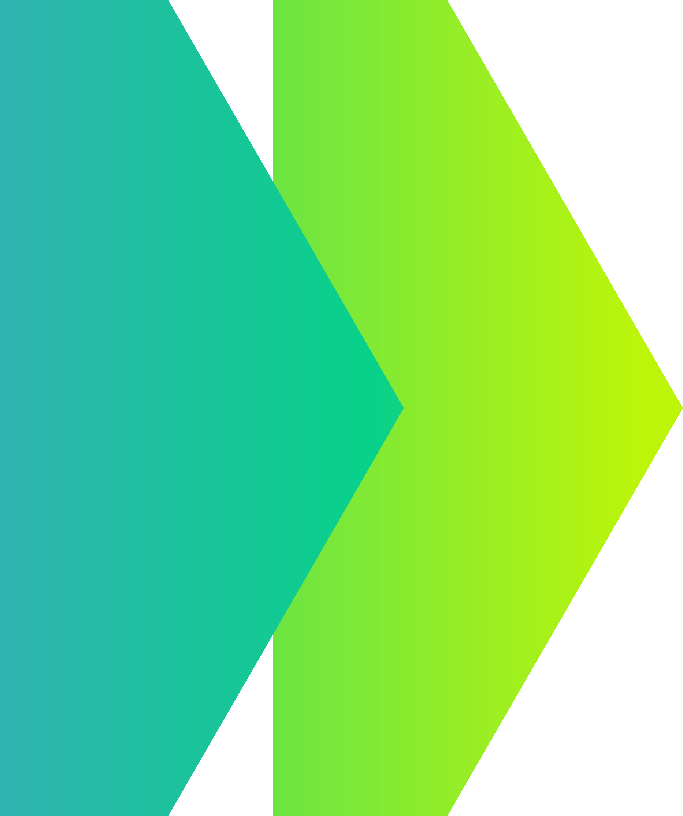
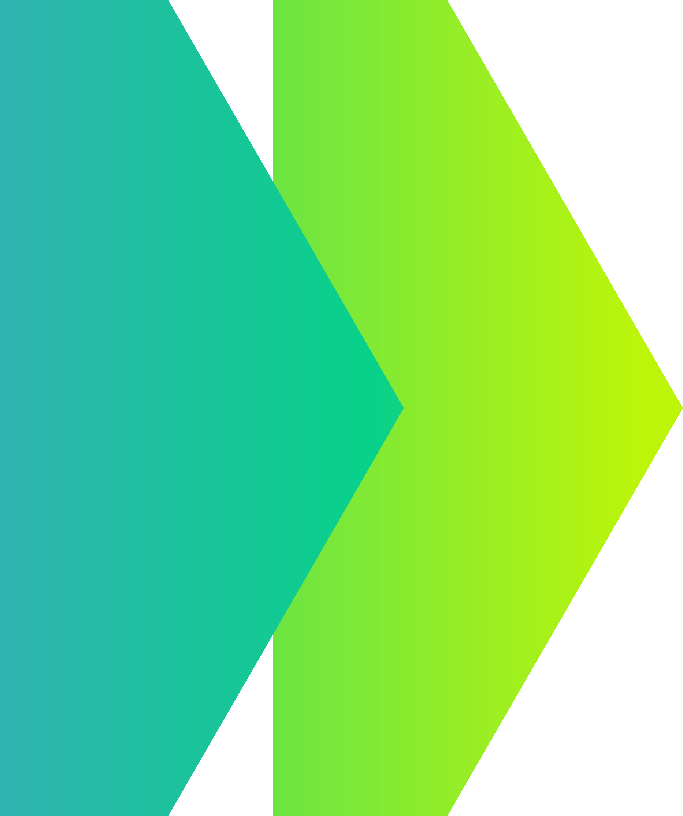
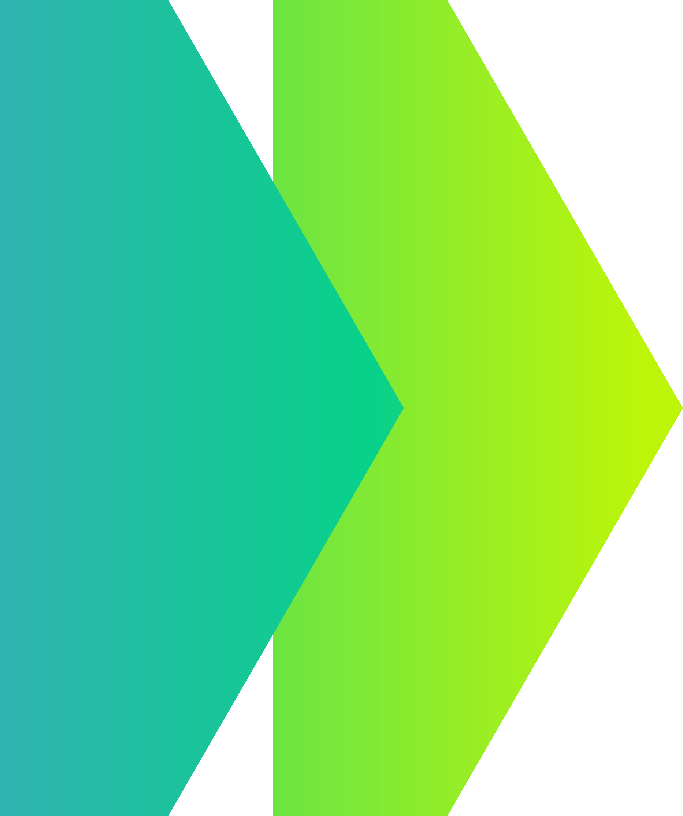

In [11]:
# display the quality assurance report
g.reports(display=True)

In [12]:
# Generate a synthetic dataset of the same size as the original (100,000 rows)
sd = mostly.generate(g)

Overall job progress                                       ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━    100% 0:01:15
Step flat_training:tabular GENERATE_DATA_TABULAR           ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━    100% 0:00:10
Step flat_training:tabular CREATE_DATA_REPORT_TABULAR      ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━    100% 0:00:44
Step common FINALIZE_GENERATION                            ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━    100% 0:00:18
Step common DELIVER_DATA                                   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━    100% 0:00:00

🎉 Your synthetic dataset is ready! Use it to consume the generated data. Publish it so others can do the same.

In [13]:
syndata = sd.data()
syndata.to_csv('/home/mzahmerd/mostly_flat_challenge/datasets/Abdul_flat_training 7.csv', index=False)
print("successful")

successful


### Exclusive Report Generation

In [14]:
import pandas as pd
import webbrowser
from mostlyai import qa

# initialize logging to stdout
qa.init_logging()

hol = pd.read_csv('/home/mzahmerd/mostly_flat_challenge/datasets/flat-training (original).csv')
syn = pd.read_csv('/home/mzahmerd/mostly_flat_challenge/datasets/Abdul_flat_training 7.csv')
trn = df

# calculate metrics
report_path, metrics = qa.report(
    syn_tgt_data=syn,
    trn_tgt_data=trn,
    hol_tgt_data=hol,
)

# pretty print metrics
print(metrics.model_dump_json(indent=4))

# open up HTML report in new browser window
webbrowser.open(f"file://{report_path.absolute()}")

[2025-06-14 11:10:57,957] INFO   : prepared training data for accuracy: (100000, 80)
[2025-06-14 11:10:58,615] INFO   : prepared holdout data for accuracy: (100000, 80)
[2025-06-14 11:10:59,296] INFO   : prepared synthetic data for accuracy: (100000, 80)
[2025-06-14 11:10:59,756] INFO   : encode datasets for embeddings
[2025-06-14 11:11:02,192] INFO   : calculated embeddings: syn=(100000, 107), trn=(100000, 107), hol=(100000, 107)
[2025-06-14 11:11:02,193] INFO   : report accuracy and correlations
[2025-06-14 11:11:02,193] INFO   : calculate original data bins
[2025-06-14 11:11:02,813] INFO   : store original data bins
[2025-06-14 11:11:02,933] INFO   : calculate synthetic data bins
[2025-06-14 11:11:03,181] INFO   : calculate correlations
[2025-06-14 11:11:07,278] INFO   : calculate correlations
[2025-06-14 11:11:11,106] INFO   : calculated univariates for 80 columns in 1.84 seconds
[2025-06-14 11:11:15,179] INFO   : calculated bivariate accuracies for 6320 combinations in 4.07 second

True